<a href="https://colab.research.google.com/github/Lasttrader/Neural_network_mnist/blob/master/Mnist_pic_convolution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Распознаванию изображений из набора данных 
MNIST и CIFAR-10 
с помощью свёрточных нейронных сетей



#Подготовка данных
Подключение библиотек

In [0]:
"""
План:
Импорт библиотек
Импорт данных (свои или из базы)
Название классов выхода
Тест отображения картинки/цирфы
Изменение размерности


Архитектура
1.Слой свертки
2.Слой подвыборки
3.Слой свертки
5.Слой подвыборки
6.Выходной слой 

Обучение сети 
(х и y, размер батча, количество эпох, размер выборки для обучения (Вал_сплит), шаг (вербос))

"""
from keras.datasets import mnist
from keras.datasets import cifar10
from keras.datasets import cifar100

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras import utils
from tensorflow.keras.preprocessing import image
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from matplotlib import pyplot

Загрузка данных

In [0]:
# Общая выборка = выборка для обучения + выборка для теста => оценка качества сети

# x_train_org - изображения из набора данных для обучения
# y_train_org - правильные ответы (метки) к набору данных для обучения

# НАБОР ДЛЯ ТЕСТИРОВАНИЯ - ПРОВЕРКИ
# x_test_org - изображения из набора данных для тестирования
# y_test_org - правильные ответы (метки) к набору данных для тестирования


(x_train, y_train), (x_test, y_test) = mnist.load_data() # числа
(x_train10, y_train10), (x_test10, y_test10) = cifar10.load_data() # cifar 10
(x_train100, y_train100), (x_test100, y_test100) = cifar100.load_data() #cifar 100


classes=['самолет', 'автомобиль', 'птица', 'кот', 'олень', 'собака', 'лягушка', 'лошадь', 'корабль', 'грузовик']

y_train = utils.to_categorical(y_train, 10)
y_train10 = utils.to_categorical(y_train10, 10)
y_train100 = utils.to_categorical(y_train100, 100)

Отображение картинки на выбор

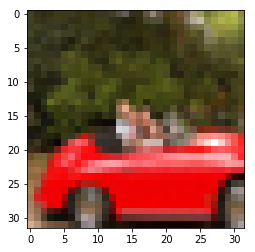

In [0]:
n = 99
plt.imshow(Image.fromarray(x_train10[n]).convert('RGBA'))
plt.show()



In [0]:
#print(x_train10[0][0])
print(y_train10[n])

[0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]


Изменение размерности данных MNIST для работы счёрточных сетей

In [0]:
x_train = x_train.reshape(x_train.shape[0], 28, 28, 1) # Обучающая - тренировочная

x_test = x_test.reshape(x_test.shape[0], 28, 28, 1) # Проверочная - рабочая

#  Промежуточная отсутствует.

#Нейронные сети
Базовая архитектура свёрточной сети для работы с набором MNIST

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_33 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 14, 14, 32)        0         
_________________________________________________________________
flatten_12 (Flatten)         (None, 6272)              0         
_________________________________________________________________
dense_19 (Dense)             (None, 10)                62730     
Total params: 63,050
Trainable params: 63,050
Non-trainable params: 0
_________________________________________________________________
None
Train on 48000 samples, validate on 12000 samples
Epoch 1/20
48000/48000 [==============================] - 2s 40us/sample - loss: 1.5077 - acc: 0.9049 - val_loss: 0.2801 - val_acc: 0.9616
Epoch 2/20
48000/48000 [=============================

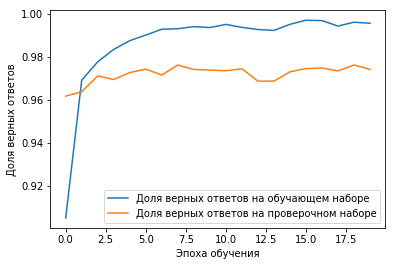

In [0]:
"""
Sequential - сверточная сеть последовательные слои
Conv2D - свертночный слой. Класс 32 - ядра свертки (32 разных изображения) картинки,  3х3 размер области
1 слой размер входных данных - 28х28 квадратные картинки (от 32) 1- кол-во каналов данных(градация серого)

"""



model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(28, 28, 1)))
model.add(MaxPooling2D(pool_size=(2, 2))) # слой подвыборки из 4х4 делает 2х2

# сдесь может быть слой Dropout
# дальше может быть второй слой с другим размером признаком 64, 128 или любой + активация
# пул
# дроаут

model.add(Flatten()) # выпрямляет значения 

model.add(Dense(10, activation='softmax')) # слой выходной по количеству классов - полносвязная

# categorical_crossentropy - для классификации
# adam - 
# accuracy - метрика

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

# вывод ахитектуры сети
print(model.summary())

# обучение сети 
history = model.fit(x_train, 
                    y_train, 
                    batch_size=200, 
                    epochs=20,
                    validation_split=0.2,
                    verbose=1)
# печать результатов
plt.plot(history.history['acc'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(history.history['val_acc'], 
         label='Доля верных ответов на проверочном наборе')

plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')

plt.legend()
plt.show()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_14 (Batc (None, 28, 28, 1)         4         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_21 (Dropout)         (None, 14, 14, 32)        0         
_________________________________________________________________
batch_normalization_15 (Batc (None, 14, 14, 32)        128       
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 14, 14, 64)      

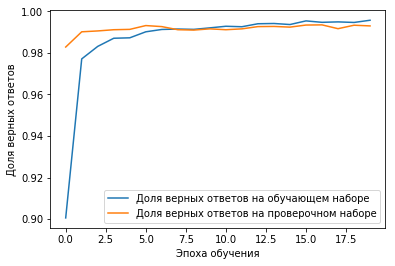

In [0]:
# Архитектура
model = Sequential()

# №1
# Нормализация от 0 до 1
model.add(BatchNormalization(input_shape=(28, 28, 1))) # пакетная нормализация
# Слои свертки
model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
# слой подвыборки из делает 2х2
model.add(MaxPooling2D(pool_size=(2, 2)))
# Работа с переобучением
model.add(Dropout(0.25))

# №2
model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), padding='same', activation='relu')) # padding - добавление пикселей для 3х3
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# №3
model.add(Flatten())
# полносвязный слой для классификации
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
# Выходной полносвязный слой
model.add(Dense(10, activation='softmax'))

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
print(model.summary())

# Обучение
history = model.fit(x_train, 
                    y_train, 
                    batch_size=200, 
                    epochs=20,
                    validation_split=0.2,
                    verbose=1)
# Print
plt.plot(history.history['acc'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(history.history['val_acc'], 
         label='Доля верных ответов на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

Train on 40000 samples, validate on 10000 samples
Epoch 1/20
40000/40000 [==============================] - 6s 150us/sample - loss: 1.7310 - acc: 0.3774 - val_loss: 1.6582 - val_acc: 0.5099
Epoch 2/20
40000/40000 [==============================] - 5s 126us/sample - loss: 1.2577 - acc: 0.5478 - val_loss: 1.1314 - val_acc: 0.6227
Epoch 3/20
40000/40000 [==============================] - 5s 125us/sample - loss: 1.0868 - acc: 0.6096 - val_loss: 0.9219 - val_acc: 0.6780
Epoch 4/20
40000/40000 [==============================] - 5s 126us/sample - loss: 0.9800 - acc: 0.6521 - val_loss: 0.8778 - val_acc: 0.6909
Epoch 5/20
40000/40000 [==============================] - 5s 127us/sample - loss: 0.8860 - acc: 0.6871 - val_loss: 0.8121 - val_acc: 0.7148
Epoch 6/20
40000/40000 [==============================] - 5s 129us/sample - loss: 0.8127 - acc: 0.7112 - val_loss: 0.8380 - val_acc: 0.7099
Epoch 7/20
40000/40000 [==============================] - 5s 128us/sample - loss: 0.7526 - acc: 0.7322 - val_l

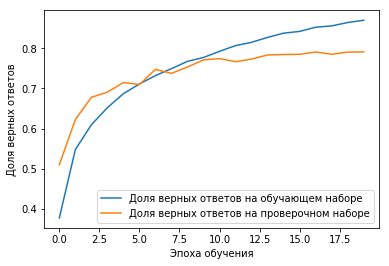

In [0]:
model = Sequential()
model.add(BatchNormalization(input_shape=(32, 32, 3)))
model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax'))

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

history = model.fit(x_train10, 
                    y_train10, 
                    batch_size=200, 
                    epochs=20,
                    validation_split=0.2,
                    verbose=1)

plt.plot(history.history['acc'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(history.history['val_acc'], 
         label='Доля верных ответов на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

Распознавание случайной цифры из тестового набора

In [0]:
prediction = model.predict(x_train10)

Выход сети:  [3.4313980e-06 1.6383284e-08 7.0461456e-04 9.3340266e-01 2.7406192e-04
 6.3903272e-02 3.8020822e-04 1.3312171e-03 3.0413941e-07 2.1542827e-07]
Распознанная картинка:  3 кот
Верный ответ:  3 кот


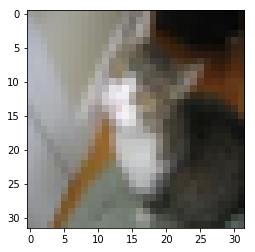

In [0]:
n = 101
print("Выход сети: ", prediction[n])
print("Распознанная картинка: ", np.argmax(prediction[n]), classes[np.argmax(prediction[n])])
print("Верный ответ: ",  np.argmax(y_train10[n]), classes[np.argmax(y_train10[n])])


plt.imshow(Image.fromarray(x_train10[n]).convert('RGBA'))
plt.show()

Вариант нейронной сети для работы с набором CIFAR10
Отличия от базовой архитектуры:
- ядро свёртки первого слоя - 7, 7
- MaxPooling слои 4, 4 вместо базовых 2, 2

Train on 40000 samples, validate on 10000 samples
Epoch 1/20
40000/40000 [==============================] - 7s 164us/sample - loss: 1.8816 - acc: 0.3218 - val_loss: 1.5976 - val_acc: 0.4375
Epoch 2/20
40000/40000 [==============================] - 6s 138us/sample - loss: 1.4227 - acc: 0.4823 - val_loss: 1.3103 - val_acc: 0.5365
Epoch 3/20
40000/40000 [==============================] - 6s 139us/sample - loss: 1.2626 - acc: 0.5465 - val_loss: 1.1381 - val_acc: 0.5904
Epoch 4/20
40000/40000 [==============================] - 6s 141us/sample - loss: 1.1359 - acc: 0.5938 - val_loss: 1.0275 - val_acc: 0.6380
Epoch 5/20
40000/40000 [==============================] - 6s 139us/sample - loss: 1.0414 - acc: 0.6284 - val_loss: 0.9517 - val_acc: 0.6605
Epoch 6/20
40000/40000 [==============================] - 6s 140us/sample - loss: 0.9616 - acc: 0.6589 - val_loss: 0.8674 - val_acc: 0.7022
Epoch 7/20
40000/40000 [==============================] - 6s 139us/sample - loss: 0.9014 - acc: 0.6834 - val_l

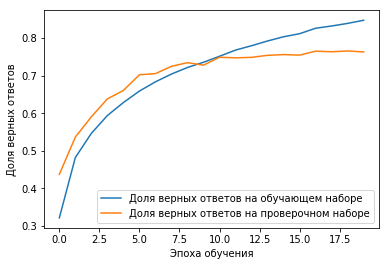

In [0]:
model = Sequential()
model.add(BatchNormalization(input_shape=(32, 32, 3)))
model.add(Conv2D(32, (7, 7), padding='same', activation='relu'))
model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax'))

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

history = model.fit(x_train10, 
                    y_train10, 
                    batch_size=200, 
                    epochs=20,
                    validation_split=0.2,
                    verbose=1)

plt.plot(history.history['acc'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(history.history['val_acc'], 
         label='Доля верных ответов на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

Распознавание случайной картинки из тестового набора

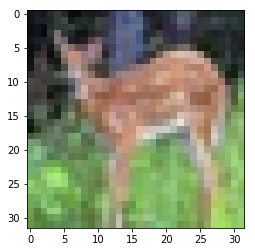

Выход сети:  [3.4284396e-06 1.4899930e-06 8.5848197e-03 3.8896494e-03 8.8883954e-01
 7.2546662e-03 3.5133932e-02 5.6291547e-02 1.1974456e-07 8.5332965e-07]
Распознанный образ:  4
Верный ответ:  [4]
Распознанный браз на картинке:  олень


In [0]:
n = 1523
prediction = model.predict(x_test10)

plt.imshow(Image.fromarray(x_test10[n]).convert('RGBA'))
plt.show()
print("Выход сети: ", prediction[n])
print("Распознанный образ: ", np.argmax(prediction[n]))
print("Верный ответ: ", y_test10[n])
print("Распознанный браз на картинке: ", classes[np.argmax(prediction[n])])

## Тестовая загрузка изображения с локального компьютера


In [0]:
files.upload()

Saving 20190803_215623.jpg to 20190803_215623.jpg


{'20190803_215623.jpg': b'\xff\xd8\xff\xe1\x04\x8cExif\x00\x00II*\x00\x08\x00\x00\x00\x0b\x00\x0f\x01\x02\x00\x08\x00\x00\x00\xa2\x00\x00\x00\x10\x01\x02\x00\t\x00\x00\x00\xaa\x00\x00\x00\x12\x01\x03\x00\x01\x00\x00\x00\x06\x00\x00\x00\x1a\x01\x05\x00\x01\x00\x00\x00\x92\x00\x00\x00\x1b\x01\x05\x00\x01\x00\x00\x00\x9a\x00\x00\x00(\x01\x03\x00\x01\x00\x00\x00\x02\x00\x00\x001\x01\x02\x00\x0e\x00\x00\x00\xb4\x00\x00\x002\x01\x02\x00\x14\x00\x00\x00\xc2\x00\x00\x00\x13\x02\x03\x00\x01\x00\x00\x00\x01\x00\x00\x00i\x87\x04\x00\x01\x00\x00\x00\xd6\x00\x00\x00%\x88\x04\x00\x01\x00\x00\x00\xb6\x03\x00\x00\x00\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00samsung\x00SM-G950F\x00\x00G950FXXU5DSFB\x002019:08:03 21:56:23\x00$\x00\x9a\x82\x05\x00\x01\x00\x00\x00\x8c\x02\x00\x00\x9d\x82\x05\x00\x01\x00\x00\x00\x94\x02\x00\x00"\x88\x03\x00\x01\x00\x00\x00\x02\x00\x00\x00\'\x88\x03\x00\x01\x00\x00\x00\xc8\x00\x00\x00\x00\x90\x07\x00\x04\x00\x00\x000220\x03\x90\x02\x00\x14\x00\x0

Проверяем загрузку файлов

In [0]:
!ls

20190803_215623.jpg  cat.jpg  sample_data


**Смотрим загруженную картинку**

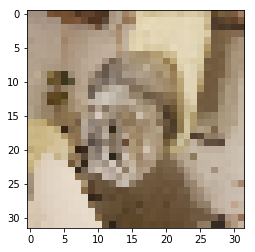

In [0]:
img_path = '20190803_215623.jpg'
img = image.load_img(img_path, target_size=(32, 32))
plt.imshow(img)
plt.show()

**Преобразуем картинку в массив для распознавания**

In [0]:
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)

**Запускаем распознавание**

In [0]:
prediction = model.predict(x)
prediction = np.argmax(prediction)
print("Распознанный образ: ", prediction)
print("Название распознанного образа: ", classes[prediction])

Распознанный образ:  6
Название распознанного образа:  лягушка


#Мощная архитектура (Исследование)

In [0]:
model = Sequential()
model.add(BatchNormalization(input_shape=(32, 32, 3)))
model.add(Conv2D(1024, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(1024, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(2))
model.add(Dropout(0.25))

model.add(BatchNormalization())
model.add(Conv2D(512, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(512, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(2))
model.add(Dropout(0.25))
          
model.add(BatchNormalization())
model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(2))
model.add(Dropout(0.25))

model.add(BatchNormalization())
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(2))
model.add(Dropout(0.25))          

model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(Dropout(0.25))              

model.add(Flatten())
model.add(BatchNormalization())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(10, activation='softmax'))

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

history = model.fit(x_train10, 
                    y_train10, 
                    batch_size=batch_size, 
                    epochs=20,
                    validation_split=0.2,
                    verbose=1)

plt.plot(history.history['acc'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(history.history['val_acc'], 
         label='Доля верных ответов на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()